<a href="https://colab.research.google.com/github/Sontam3000/ComputerVision_PredictionProblem/blob/main/DogVision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Multi-Class Dog Breed Classification
Using Tensor Flow and Tensor Flow Hub.

* ### Problem
Identifying the dog breed.

* ### Data
Data from kaggle :
[Kaggle Dog Breed Idenntification](https://www.kaggle.com/competitions/dog-breed-identification)

* ### Evalutaion
File with prediction probabilities of each dog with each dog each test image.
[Evaluation Criteria](https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation)

* ### Feature
  *  Unstructured Data
  *  Use Deep Learning/ Transfer Learning
  *  120 breeds of dog(120 different classes).
  *  Around 10,000+ in both train and test data.
  *  Images have no labels as we are predicting them.




In [ ]:
#mounting google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#unzip data from folder
#!unzip "drive/My Drive/Colab Data/DogVision/dog-breed-identification.zip" -d "drive/My Drive/Colab Data/DogVision/"

## Workspace Starts
* Import TensorFlow and Tensor Flow Hub.
* Make Sure using GPU


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

# GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.18.0
Hub version: 0.16.1
GPU available


### Getting data ready
##### Turn our images into Tensors (numerical representation)
##### Access data and check labels.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

labels = pd.read_csv("drive/My Drive/Colab Data/DogVision/labels.csv")
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


<Axes: xlabel='breed'>

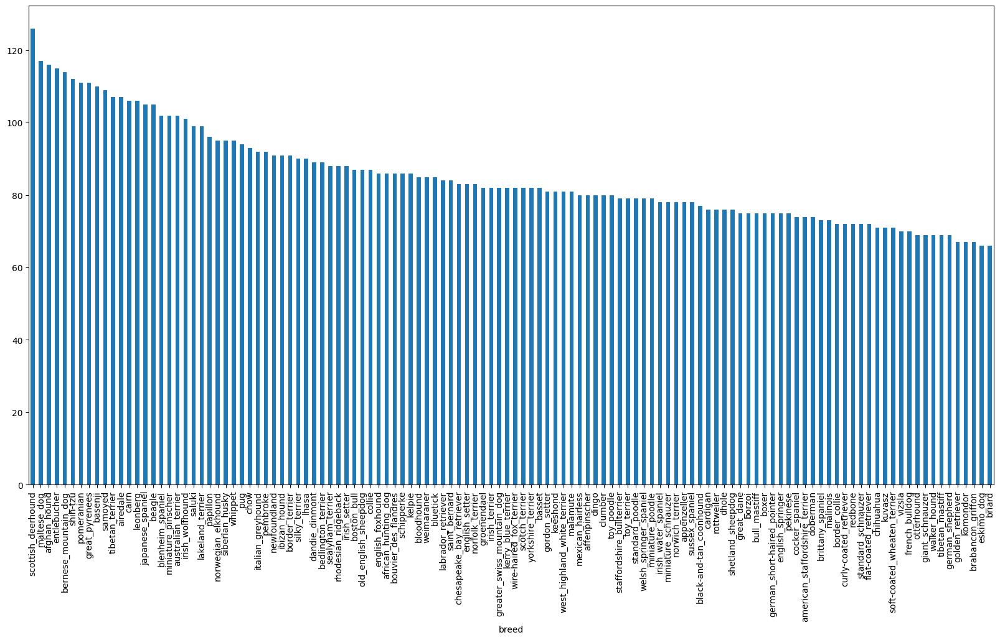

In [ ]:
# how many images of each dog breed
labels["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels["breed"].value_counts().median()
## Google Auto ML : at least 10 image , each with least 1 annotation
#                 : For model training purpose, recommended to use 100 annotation per label

82.0

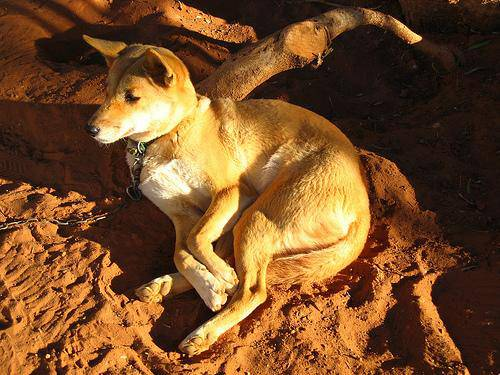

In [ ]:
# View image
from IPython.display import Image
Image("drive/My Drive/Colab Data/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

 #### Getting Image and Their labels
 Getting list of our image file pathnames

In [ ]:
# Create pathname from image ID
filenames = [fname for fname in labels["id"].values]
filenames = ["drive/My Drive/Colab Data/DogVision/train/" + fname + ".jpg" for fname in filenames]
filenames[:10]

['drive/My Drive/Colab Data/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Colab Data/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Colab Data/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Colab Data/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Colab Data/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Colab Data/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Colab Data/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Colab Data/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Colab Data/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Colab Data/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if(len(os.listdir("drive/My Drive/Colab Data/DogVision/train/")))== len(filenames):
  print("Filename Number Matched with actual number of image")
else:
  print("Filename Number Not Matched with actual number of image")

Filename Number Matched with actual number of image


In [ ]:
labels['breed'][9000]

'tibetan_mastiff'

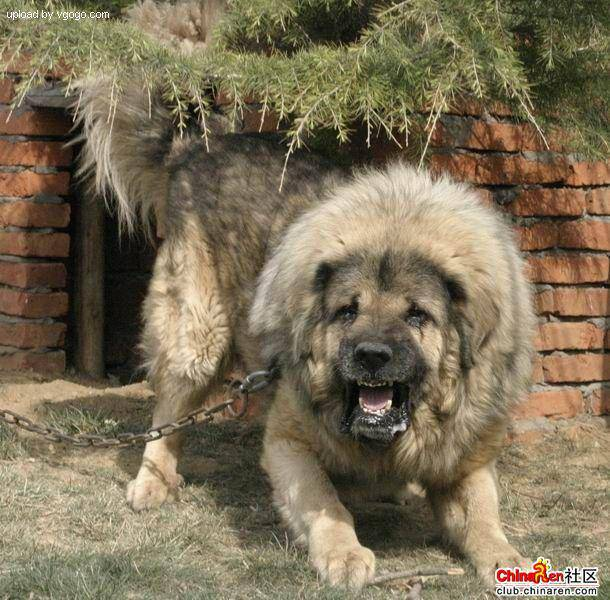

In [ ]:
Image(filenames[9000])

### Prepare Labels

In [ ]:
labels

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
len(labels)

10222

In [ ]:
# if filename and labels length is same or not
if len(labels) == len(filenames):
  print("Length Matched")
else:
  print("Length Not Matched")


Length Matched


In [ ]:
# unique labels
unique_breeds = np.unique(labels)
unique_breeds

array(['000bec180eb18c7604dcecc8fe0dba07',
       '001513dfcb2ffafc82cccf4d8bbaba97',
       '001cdf01b096e06d78e9e5112d419397', ..., 'whippet',
       'wire-haired_fox_terrier', 'yorkshire_terrier'], dtype=object)

In [ ]:
# Turn every label into boolean labels
boolean_labels = []  # Initialize an empty list
for label in labels["breed"]: # Iterate through each breed in the 'breed' column
    boolean_label = [label_ == label for label_ in unique_breeds]  # Create boolean labels for each unique breed
    boolean_labels.append(boolean_label)  # Append the boolean labels to the list
# Now boolean_labels contains a list of boolean labels for each image


In [ ]:
print(labels.iloc[0]) # Access the first row of the DataFrame
print(np.where(unique_breeds == labels.iloc[0]['breed'])[0][0]) # Access the 'breed' value from the first row
print(boolean_labels[0]) # index where label occurs in boolean array
print(boolean_labels[0]) # there will be a 1 where the sample label occurs

id       000bec180eb18c7604dcecc8fe0dba07
breed                         boston_bull
Name: 0, dtype: object
7687
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False

### Validation set creation


In [ ]:
x = filenames
y = boolean_labels
len(x), len(y)
x[:1], y[:1]

(['drive/My Drive/Colab Data/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg'],
 [[False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   Fa

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

1000

In [ ]:
# Import train_test_split from Scikit-Learn
from sklearn.model_selection import train_test_split

# Split them into training and validation using NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
x_train[:2], y_train[:1]

(['drive/My Drive/Colab Data/DogVision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Colab Data/DogVision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [[False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
   False,
 

 ### Preprocess image, turning images into tensors
 To preprocess our images into Tensors we're going to write a function which does a few things:

* Takes an `image` filename as input.
* Uses TensorFlow to read the file and save it to a variable, `image`.
* Turn our image (a jpeg file) into Tensors.
* Resize the `image` to be of shape (224, 224).
* Return the modified `image`.


In [ ]:
# turn images into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape #(257, 350, 3) height,width, 3 is number of channel per pixel (R,G,B)

(257, 350, 3)

In [ ]:
#create constant
tf_constant = tf.constant(image)
tf_constant

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
IMG_SIZE = 224
image_size = IMG_SIZE

def process_image(image_path, image_size):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # read image
  image = tf.io.read_file(image_path)

  # turn jpeg into numerical tensor
  image = tf.image.decode_jpeg(image, channels=3)

  image.shape

  #convert color value from 0-255 to 0-1 values NORMALIZATION
  image = tf.image.convert_image_dtype(image, tf.float32)

  # resize image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

#### Turning data into batches
We are dealing with 10,000+ images . Together, these files may take up more memory than your GPU has. Trying to compute on them all would result in an error.

Instead, it's more efficient to create smaller batches of your data and compute on one batch at a time.

TensorFlow is very efficient when your data is in batches of (image, label) Tensors. So we'll build a function to do create those first. We'll take advantage of of process_image function at the same time.

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path, IMG_SIZE)
  return image, label

In [ ]:
 process_image(x[43], tf.constant(y[43]))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.6932511 , 0.6422707 , 0.50893736],
        [0.7049195 , 0.6539391 , 0.51668423],
        [0.7189601 , 0.66415447, 0.5268996 ],
        ...,
        [0.28510195, 0.23804314, 0.19098432],
        [0.23658979, 0.18953097, 0.14247213],
        [0.17295183, 0.13373615, 0.08667732]],

       [[0.68057597, 0.6295956 , 0.49626228],
        [0.69162816, 0.64064777, 0.50731444],
        [0.706784  , 0.6519783 , 0.51481974],
        ...,
        [0.29755813, 0.2504993 , 0.20344049],
        [0.24967629, 0.20261747, 0.15555863],
        [0.18719192, 0.14797622, 0.10091741]],

       [[0.6738776 , 0.6228972 , 0.49740702],
        [0.6841212 , 0.6331408 , 0.5004377 ],
        [0.7016797 , 0.64304876, 0.51417094],
        ...,
        [0.25748226, 0.21042345, 0.16336462],
        [0.23216338, 0.18510455, 0.13804573],
        [0.17874685, 0.13953117, 0.09247234]],

       ...,

       [[0.56411815, 0.5932849 , 0.50466436],
        [0.66

In [ ]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 10342), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 10342), dtype=tf.bool, name=None)))

In [ ]:
unique_breeds[labels.iloc[0].argmax()]

'001513dfcb2ffafc82cccf4d8bbaba97'

In [ ]:
#Visualize
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

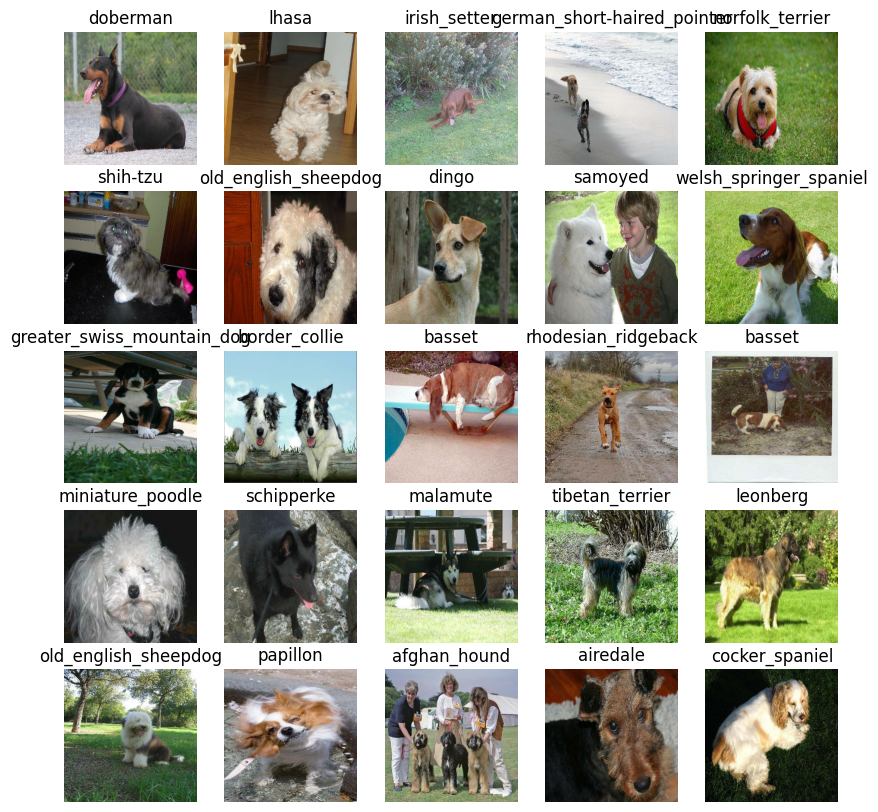

In [ ]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

In [ ]:
len(train_images), len(train_labels) # batches

(32, 32)

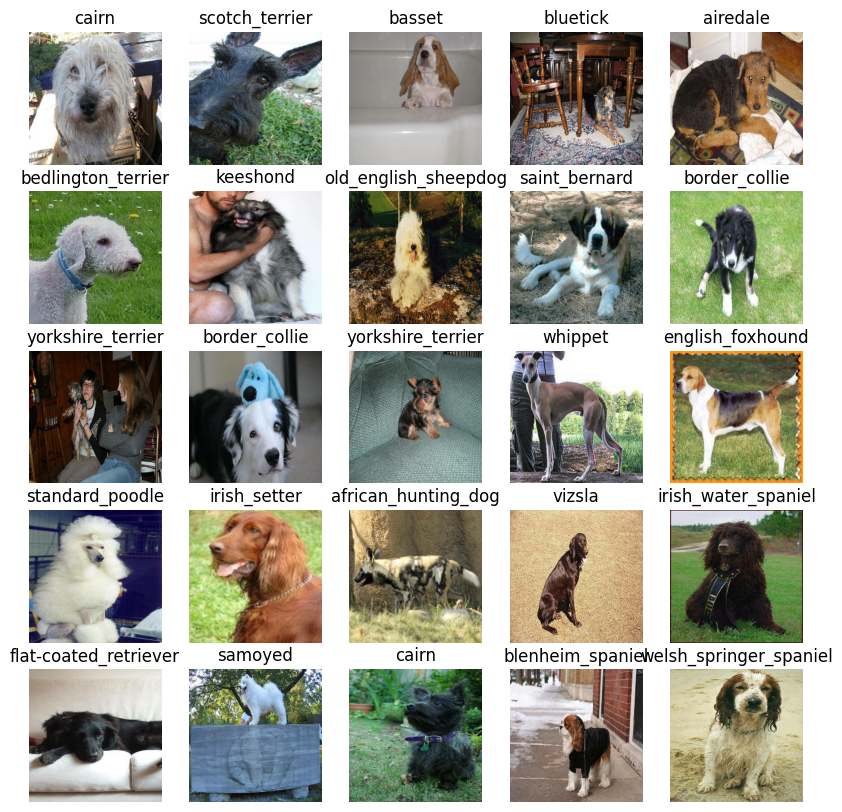

In [ ]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### Building a model
Before we build a model, there are a few things we need to define:

The input shape (images, in the form of Tensors) to our model.
The output shape (image labels, in the form of Tensors) of our model.
The URL of the model we want to use.
These things will be standard practice with whatever machine learning model you use. And because we're using TensorFlow, everything will be in the form of Tensors.

In [ ]:
# Setup Input Shape to models
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

* Takes the input shape, output shape and the model we've chosen's URL as parameters.
* Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells it what kind of input shape it'll be getting).
* Returns the model.

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Create the model using the Functional API
  model = tf.keras.Sequential([
      tf.keras.layers.InputLayer(input_shape=input_shape[1:]),
      tf.keras.layers.Lambda(lambda x: hub.KerasLayer(MODEL_URL, trainable=False)(x)),  # Wrap hub.KerasLayer in Lambda
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  return model

In [ ]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 10342)               │      10,362,684 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,362,684 (39.53 MB)

 Trainable params: 10,362,684 (39.53 MB)

 Non-trainable params: 0 (0.00 B)

### Creating callbacks
Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.
The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

TensorBoard Callback
TensorBoard helps provide a visual way to monitor the progress of your model during and after training.

It can be used directly in a notebook to track the performance measures of a model such as loss and accuracy.

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

* Load the TensorBoard notebook extension.
* Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
* Visualize the our models training logs using the %tensorboard magic function (we'll do this later on).

In [ ]:
 # Load TensorBoard notebook extension
 %load_ext tensorboard

In [ ]:
import datetime

# create function to build TensorBoard Callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Colab Data/logs",
                        #Make it so logs get tracked during experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

#### Early Stopping Callback
Helps our model from overfitting by stopping training if a certain evaluation metrcic stops



In [ ]:
#Create early stop
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

#### Training data (on subset)
Training a model (on a subset of data)
Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.

In [ ]:
 NUM_EPOCHS = 100 #@param {type:"slider", min : 10, max : 100}

In [ ]:
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


### TensorBoard Callback
#### To setup a TensorBoard callback, we need to do 3 things:

* Load the TensorBoard notebook extension ✅
* Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
* Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

In [ ]:
# build a function to train
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# fit model to data
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 305s 12s/step - accuracy: 0.1253 - loss: 8.2166 - val_accuracy: 0.4100 - val_loss: 4.6723
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 35s 186ms/step - accuracy: 0.7656 - loss: 2.5091 - val_accuracy: 0.6100 - val_loss: 2.3138
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - accuracy: 0.9417 - loss: 0.6630 - val_accuracy: 0.6450 - val_loss: 1.6222
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - accuracy: 0.9927 - loss: 0.2274 - val_accuracy: 0.6800 - val_loss: 1.3983
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - accuracy: 1.0000 - loss: 0.1262 - val_accuracy: 0.7000 - val_loss: 1.3166
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - accuracy: 1.0000 - loss: 0.0932 - val_accuracy: 0.7000 - val_loss: 1.2723
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 184ms/step - accuracy: 1.0000 - loss: 0.0697 - val_accuracy: 0.7250 - val_loss:

It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

Note: Overfitting to begin with is a good thing! It means our model is learning!!!

In [ ]:
#checking logs
%tensorboard --logdir drive/MyDrive/Colab\Data/logs

<IPython.core.display.Javascript object>

### Making and evaluatin prediciton using training model


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 10342), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 915ms/step


array([[3.7483701e-07, 8.6453218e-07, 7.8858778e-07, ..., 4.0468833e-04,
        3.3435172e-05, 4.2896341e-03],
       [6.8432082e-06, 8.8087427e-06, 7.2562825e-06, ..., 1.2971368e-03,
        2.0400218e-03, 2.4861490e-04],
       [1.5600064e-07, 1.4001236e-07, 1.5622456e-07, ..., 1.1185591e-04,
        3.0797477e-05, 1.3324604e-04],
       ...,
       [9.1231129e-08, 6.4962236e-08, 9.0716128e-08, ..., 2.0515459e-05,
        1.3301012e-04, 5.9561255e-05],
       [7.9002001e-07, 1.3932898e-06, 1.4851323e-06, ..., 1.6404103e-04,
        4.5689725e-05, 8.7525351e-03],
       [3.1052639e-06, 7.9813117e-06, 6.9921234e-06, ..., 7.8493869e-03,
        8.7664375e-04, 1.7688250e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 10342)

In [ ]:
len(y_val), len(unique_breeds ), len(predictions[0])

(200, 10342, 10342)

In [ ]:
# First prediction
index = 12
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.8677439e-07 2.6843313e-07 1.7088540e-07 ... 9.8520104e-06 3.9438982e-04
 2.2959660e-01]
Max value (probability of prediction): 0.39770230650901794
Sum: 1.0
Max index: 10324
Predicted label: silky_terrier


In [ ]:
unique_breeds[10341]

'yorkshire_terrier'

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images_ = []
  labels_ = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    # Get the index of the true label from the boolean array
    index = np.argmax(label)
    # Assuming unique_breeds contains the actual breed names
    labels_.append(unique_breeds[index])
  return images_, labels_

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_images[0])

'02ad779f2721db9364d3bb68f5580582'

Now we've got ways to get get:



*  Prediction labels
*  Validation labels (truth labels)
*  Validation images



Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

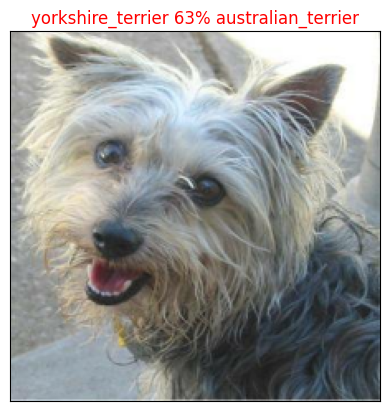

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n= 98)

The function visualizes our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
*Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

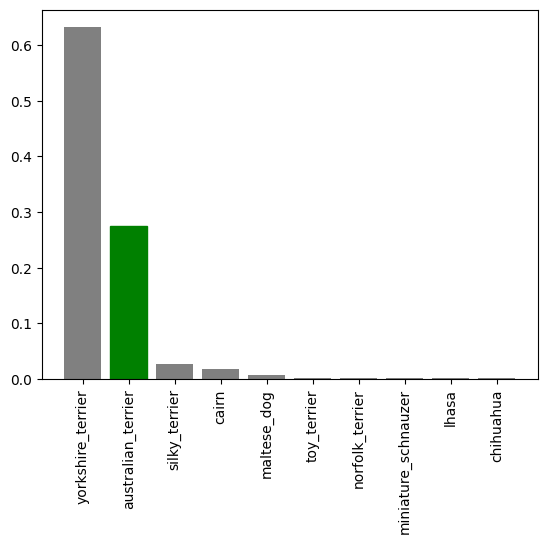

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=98)

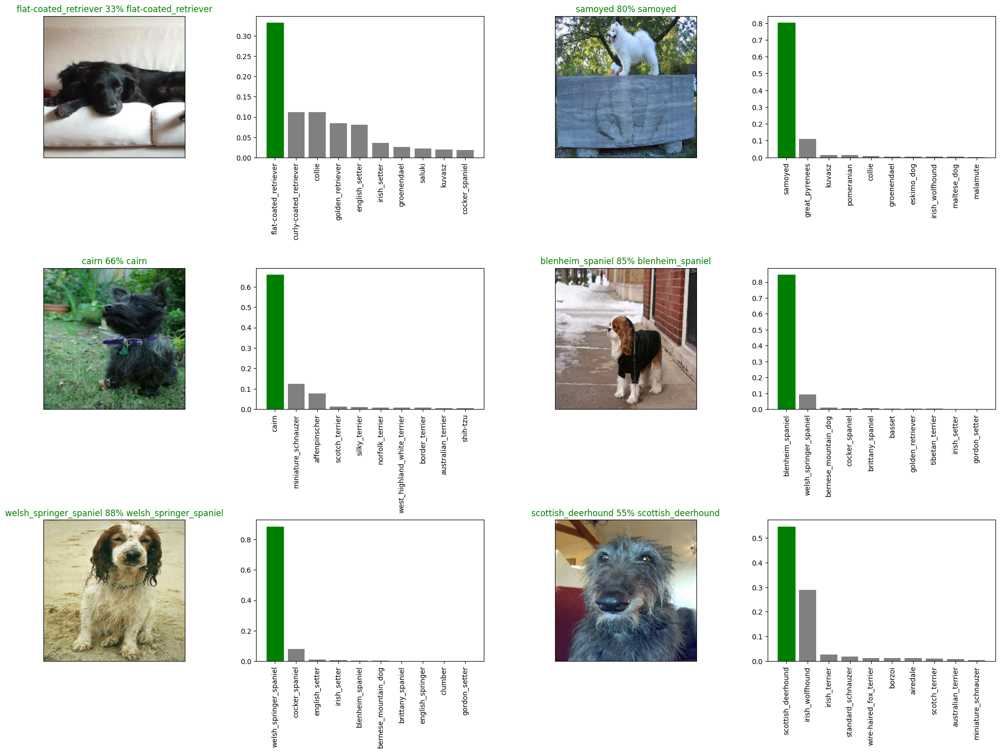

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving And Reloading Model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join(r"drive/MyDrive/Colab Notebooks/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  # Create a model instance before loading weights
  model = create_model()  # Using the same architecture defined in `create_model()`
  model.load_weights(model_path)  # Use load_weights to load only the weights
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-model-mobilenet")

Saving model to: drive/MyDrive/Colab Notebooks/models/20250207-17021738947771-1000-images-model-mobilenet.h5...


'drive/MyDrive/Colab Notebooks/models/20250207-17021738947771-1000-images-model-mobilenet.h5'

In [ ]:
# Load a trained model using the CORRECT load_model function
loaded_1000_image_model = load_model('drive/MyDrive/Colab Notebooks/models/20250204-21101738703450-1000-images-model-mobilenet.h5')

Loading saved model from: drive/MyDrive/Colab Notebooks/models/20250204-21101738703450-1000-images-model-mobilenet.h5
Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - accuracy: 0.7159 - loss: 1.1165


[1.188496708869934, 0.7149999737739563]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 399ms/step - accuracy: 0.6964 - loss: 1.1722


[1.2240675687789917, 0.6899999976158142]

## Training the dog model on full dataset

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(x, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 10342), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 2497s 8s/step - accuracy: 0.5657 - loss: 3.1202
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 109s 164ms/step - accuracy: 0.9025 - loss: 0.3490
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 79s 153ms/step - accuracy: 0.9459 - loss: 0.2084
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 128ms/step - accuracy: 0.9731 - loss: 0.1302
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 83s 132ms/step - accuracy: 0.9800 - loss: 0.0958
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 131ms/step - accuracy: 0.9899 - loss: 0.0677
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 128ms/step - accuracy: 0.9920 - loss: 0.0561
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 128ms/step - accuracy: 0.9965 - loss: 0.0418
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 126ms/step - accuracy: 0.9972 - loss: 0.0319
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - accuracy: 0.9952 - loss: 0.0322
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - accuracy: 0.9978 - loss: 0.0238
Epoch 12

In [ ]:
save_model(full_model, suffix="FULL-IMAGE-SET")

Saving model to: drive/MyDrive/Colab Notebooks/models/20250207-18051738951551-FULL-IMAGE-SET.h5...


'drive/MyDrive/Colab Notebooks/models/20250207-18051738951551-FULL-IMAGE-SET.h5'

In [ ]:
loaded_full_model = load_model("drive/MyDrive/Colab Notebooks/models/20250207-18051738951551-FULL-IMAGE-SET.h5")

Loading saved model from: drive/MyDrive/Colab Notebooks/models/20250207-18051738951551-FULL-IMAGE-SET.h5
Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


## Making Predictions on Test data
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

Get the test image filenames.
Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels).
Make a predictions array by passing the test batches to the predict() method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Colab Data/DogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Colab Data/DogVision/test/96eb1dae33d7bc829d91fa9159892592.jpg',
 'drive/MyDrive/Colab Data/DogVision/test/90ccb2a05e3e33d787259e67c4887de8.jpg',
 'drive/MyDrive/Colab Data/DogVision/test/90748aa0fd5f66a4def61ebef27baedd.jpg',
 'drive/MyDrive/Colab Data/DogVision/test/920f67a628490205248d8c9b014d327c.jpg',
 'drive/MyDrive/Colab Data/DogVision/test/97d4ed796a33f67ebbec96b7ecc2dc22.jpg',
 'drive/MyDrive/Colab Data/DogVision/test/91f2d77acdbe7628a70f16b35ac2798d.jpg',
 'drive/MyDrive/Colab Data/DogVision/test/8d4c922dc3b59b2ad867ebeeca0d187f.jpg',
 'drive/MyDrive/Colab Data/DogVision/test/8e2013612b7d0584c9b70a541fed14dd.jpg',
 'drive/MyDrive/Colab Data/DogVision/test/8ff5223db38c611b40517a142019749d.jpg',
 'drive/MyDrive/Colab Data/DogVision/test/94c1fb197f86ecb3d888088406e3613b.jpg']

In [ ]:
len(test_filenames)

7180

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

Calling predict() on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

225/225 ━━━━━━━━━━━━━━━━━━━━ 1957s 9s/step


In [ ]:
import numpy as np
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Colab Data/DogVision/preds_array.csv", test_predictions, delimiter=",") # Changed 'test_predctions' to 'test_predictions'

NameError: name 'test_predictions' is not defined

In [ ]:
import numpy as np
test_predictions = np.loadtxt("drive/MyDrive/Colab Data/DogVision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.09286278e-11, 7.88448820e-12, 5.81972578e-12, ...,
        1.55241809e-11, 3.40707470e-13, 8.64419213e-14],
       [5.11734448e-12, 6.25693984e-12, 4.74572335e-12, ...,
        3.31467369e-08, 1.61619402e-13, 5.92704641e-09],
       [6.09793520e-14, 4.62744365e-14, 4.20975239e-14, ...,
        3.63310781e-13, 4.42171549e-10, 6.55399635e-04],
       ...,
       [7.87562797e-08, 6.69341205e-08, 7.89953347e-08, ...,
        1.37545531e-09, 2.06590539e-06, 2.09392553e-07],
       [1.48514838e-12, 1.32170967e-12, 1.51506141e-12, ...,
        6.49614540e-09, 7.52343465e-10, 9.32952116e-09],
       [6.03249343e-14, 5.84762883e-14, 4.93446396e-14, ...,
        5.26053784e-11, 8.18821816e-11, 5.91480753e-11]])

In [ ]:
test_predictions.shape

(7180, 10342)

Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
import pandas as pd
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,000bec180eb18c7604dcecc8fe0dba07,001513dfcb2ffafc82cccf4d8bbaba97,001cdf01b096e06d78e9e5112d419397,00214f311d5d2247d5dfe4fe24b2303d,0021f9ceb3235effd7fcde7f7538ed62,002211c81b498ef88e1b40b9abf84e1d,00290d3e1fdd27226ba27a8ce248ce85,002a283a315af96eaea0e28e7163b21b,003df8b8a8b05244b1d920bb6cf451f9,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_path = "drive/MyDrive/Colab Data/DogVision/test/"

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
test_ids

['96eb1dae33d7bc829d91fa9159892592',
 '90ccb2a05e3e33d787259e67c4887de8',
 '90748aa0fd5f66a4def61ebef27baedd',
 '920f67a628490205248d8c9b014d327c',
 '97d4ed796a33f67ebbec96b7ecc2dc22',
 '91f2d77acdbe7628a70f16b35ac2798d',
 '8d4c922dc3b59b2ad867ebeeca0d187f',
 '8e2013612b7d0584c9b70a541fed14dd',
 '8ff5223db38c611b40517a142019749d',
 '94c1fb197f86ecb3d888088406e3613b',
 '8cbea8595993c0f55000ff525a9c889e',
 '9103f5bae0e46c613ca51bab1a3457b4',
 '9059532f7c53ee523c1c63e445662ed1',
 '8d7f27306ea76bca087a0f1fe1185d87',
 '945d5bc18a470bda95312f99d0d4b1c5',
 '8dbc441067941a2038e016e0ea106541',
 '91e6c6fbf42bc6a74db07709f904a256',
 '9805253d86952524b75116e99a04bb26',
 '96002718f40bc5c6b9831b174315e142',
 '97a1cca61fa2574854d199741c42d904',
 '91629164463a0e1bf61cab33e96f66b5',
 '8f476d4376ac9c9be8a85395ea385834',
 '935d0c63e749116d3e3e34b8cd22894b',
 '96aba7f7b0dc0dec6b1f65a3a0e690d5',
 '93fa4194758960a2fffec91162579467',
 '982ec2c96fafed091914bbbda741b568',
 '8ffc8a83bb9ac7884a9420c97b23940c',
 

In [ ]:
preds_df.head()

,id,000bec180eb18c7604dcecc8fe0dba07,001513dfcb2ffafc82cccf4d8bbaba97,001cdf01b096e06d78e9e5112d419397,00214f311d5d2247d5dfe4fe24b2303d,0021f9ceb3235effd7fcde7f7538ed62,002211c81b498ef88e1b40b9abf84e1d,00290d3e1fdd27226ba27a8ce248ce85,002a283a315af96eaea0e28e7163b21b,003df8b8a8b05244b1d920bb6cf451f9,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,96eb1dae33d7bc829d91fa9159892592,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,90ccb2a05e3e33d787259e67c4887de8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,90748aa0fd5f66a4def61ebef27baedd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,920f67a628490205248d8c9b014d327c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,97d4ed796a33f67ebbec96b7ecc2dc22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,000bec180eb18c7604dcecc8fe0dba07,001513dfcb2ffafc82cccf4d8bbaba97,001cdf01b096e06d78e9e5112d419397,00214f311d5d2247d5dfe4fe24b2303d,0021f9ceb3235effd7fcde7f7538ed62,002211c81b498ef88e1b40b9abf84e1d,00290d3e1fdd27226ba27a8ce248ce85,002a283a315af96eaea0e28e7163b21b,003df8b8a8b05244b1d920bb6cf451f9,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,96eb1dae33d7bc829d91fa9159892592,1.092863e-11,7.884488e-12,5.819726e-12,3.822570e-12,9.964569e-12,6.358171e-12,5.457406e-12,6.302593e-12,6.592223e-12,...,1.516498e-13,4.436882e-08,1.113295e-09,4.390363e-08,6.856210e-13,1.549693e-15,1.242336e-11,1.552418e-11,3.407075e-13,8.644192e-14
1,90ccb2a05e3e33d787259e67c4887de8,5.117344e-12,6.256940e-12,4.745723e-12,2.561616e-12,2.874784e-12,3.401755e-12,4.861027e-12,5.089535e-12,4.057003e-12,...,5.148828e-09,7.029407e-12,4.338887e-08,1.474046e-08,1.937667e-08,2.799678e-10,1.782223e-10,3.314674e-08,1.616194e-13,5.927046e-09
2,90748aa0fd5f66a4def61ebef27baedd,6.097935e-14,4.627444e-14,4.209752e-14,3.743368e-14,5.460610e-14,9.993000e-14,6.130975e-14,6.351949e-14,3.944654e-14,...,1.311668e-08,7.835026e-07,9.220645e-09,1.538615e-11,2.515747e-08,9.389584e-09,1.124600e-06,3.633108e-13,4.421715e-10,6.553996e-04
3,920f67a628490205248d8c9b014d327c,1.197262e-09,2.377324e-09,2.212139e-09,1.966804e-09,1.901999e-09,2.358036e-09,2.090667e-09,1.921642e-09,1.462795e-09,...,9.301943e-10,2.083248e-08,1.819007e-07,2.647846e-07,3.756653e-05,6.686256e-09,1.365516e-09,3.684459e-06,1.393927e-10,9.994843e-10
4,97d4ed796a33f67ebbec96b7ecc2dc22,1.859407e-11,2.908289e-11,2.316816e-11,2.144659e-11,2.213058e-11,2.488944e-11,3.145330e-11,2.322373e-11,2.291318e-11,...,6.106157e-07,1.459788e-02,2.166220e-05,2.680338e-09,3.698933e-09,2.645824e-09,6.654484e-08,7.891049e-07,8.288570e-06,1.111341e-07


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Colab Data/DogVision/full_model_predictions_submission_1_.csv",
                index=False)

In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

In [ ]:
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)